The GitHub repository for this project can be found here: 

https://github.com/JessAlchemab/systems_bio_arabidopsis

#### **Please clone the full repository to use this file, as this notebook requires a .adj file which was exported from Cytoscape and saved in the repo in order to plot the networks.**




The README in this repository explains many of the steps in detail.

An application was created to view the network analysis steps, which can be found here:

http://arabidopsis-expression.s3-website.eu-west-2.amazonaws.com/


Here, we import the data required for the analysis, as well as the .xml file required for attempting to use ODEs to model some of the system.


In [ ]:
# CELL 0 - DATA IMPORT STEP

!curl -L https://www.ebi.ac.uk/gxa/experiments-content/E-GEOD-94457/resources/ExperimentDownloadSupplier.RnaSeqBaseline/tpms.tsv -o data.tsv


!curl -L https://www.ebi.ac.uk/biomodels/services/download/get-files/BMID000000140799/1/BMID000000140799_url.xml -o metabolism_model_urn.xml

Import all relevant modules required for this analysis

In [2]:
# CELL 1 - MODULE IMPORTS
# Set up the environment with imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
import sbmltoodepy


Read the data into numpy arrays, replace empty values with NaN, and replace headers with more useful headers which denote the length of time since the beginning of the experiment.

Then, process the data to find the 100 genes with the highest fold increase from the lowest non-zero value (i.e. the genes which increased the most at any point across the time course of the experiment). 

Plot this as a graph.

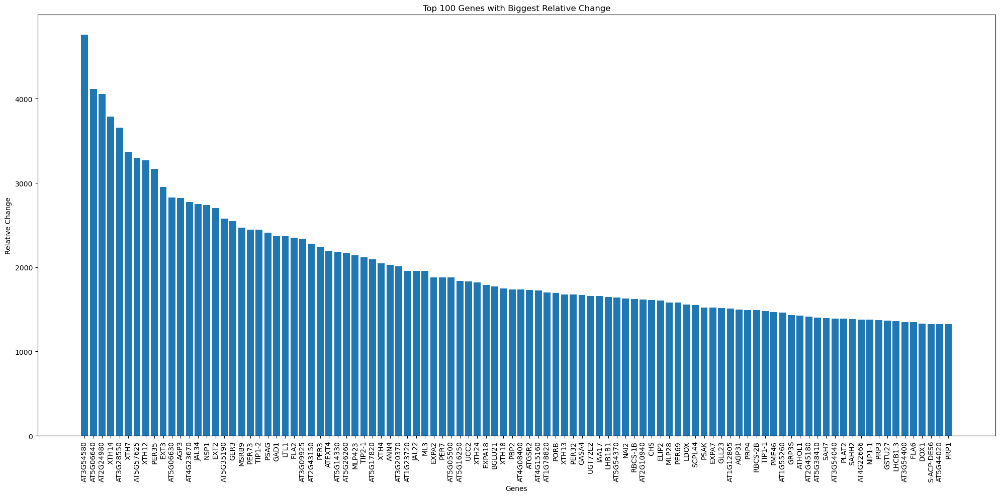

1. Gene ID: AT3G54580, Gene Name: AT3G54580, Relative Change: 4759.00
2. Gene ID: AT5G06640, Gene Name: AT5G06640, Relative Change: 4119.00
3. Gene ID: AT2G24980, Gene Name: AT2G24980, Relative Change: 4059.00
4. Gene ID: AT4G25820, Gene Name: XTH14, Relative Change: 3789.00
5. Gene ID: AT3G28550, Gene Name: AT3G28550, Relative Change: 3659.00
6. Gene ID: AT4G37800, Gene Name: XTH7, Relative Change: 3369.00
7. Gene ID: AT5G57625, Gene Name: AT5G57625, Relative Change: 3299.00
8. Gene ID: AT5G57530, Gene Name: XTH12, Relative Change: 3269.00
9. Gene ID: AT3G49960, Gene Name: PER35, Relative Change: 3169.00
10. Gene ID: AT1G21310, Gene Name: EXT3, Relative Change: 2955.25
11. Gene ID: AT5G06630, Gene Name: AT5G06630, Relative Change: 2829.00
12. Gene ID: AT4G40090, Gene Name: AGP3, Relative Change: 2824.00
13. Gene ID: AT4G23670, Gene Name: AT4G23670, Relative Change: 2773.00
14. Gene ID: AT3G16460, Gene Name: JAL34, Relative Change: 2752.33
15. Gene ID: AT3G16400, Gene Name: NSP1, Relat

In [3]:
# CELL 2 - EXPLORATORY ANALYSIS USING NUMPY

# Here we read in the data from data.tsv and put it into numpy arrays. These are used to find
# genes which have the highest fold increase over their time course and plot them using matplotlib.
# This is an exploratory step and was also used for sense checking results later on.


header_to_chronological_order_map = {
    "seed development stage, freshly harvested, 0 hour": "0",
    "dry seed stage, none, 0 hour": "336",
    "seed germination stage, stratification treatment, 1 hour": "337", 
    "seed germination stage, stratification treatment, 12 hour": "348",
    "seed germination stage, stratification treatment, 48 hour": "384",
    "seed germination stage, continuous light regimen, 1 hour": "385",
    "seed germination stage, continuous light regimen, 6 hour": "390",
    "seed germination stage, continuous light regimen, 12 hour": "396",
    "seed germination stage, continuous light regimen, 24 hour": "408",
    "seedling developmental stage, continuous light regimen, 48 hour": "432"
}

# Use numpy to read in the data from tsv, ignoring the first four lines which
# are comments
data = np.genfromtxt('data.tsv', dtype=str, delimiter='\t', skip_header=4)

# Extract headers and rename them because them being named in such a useless
# way makes everything really difficult to understand
headers = data[0]
new_headers = [header_to_chronological_order_map.get(h, h) for h in headers]
data[0] = new_headers
headers = data[0]

# Separate the actual data from the headers
data = data[1:]

# Extract Gene IDs and Gene Names, which are the first two items
gene_ids = data[:, 0]
gene_names = data[:, 1]

# Extract time data (all columns from the third onwards - the first two are
# gene ID and gene name) and also replace any empty values with nan
data[data == 'NA'] = np.nan
data[data == ''] = np.nan
time_data = data[:, 2:].astype(float)


# Replace NaN with 0 (or use another method as discussed earlier)
time_data = np.nan_to_num(time_data, nan=0.0)

# Calculate relative change from minimum to maximum value
# for each gene
def calculate_relative_change(row):
    non_zero = row[row != 0]
    if len(non_zero) == 0:
        return 0
    max_val = np.max(non_zero)
    min_val = np.min(non_zero)
    return (max_val - min_val) / min_val

relative_changes = np.apply_along_axis(calculate_relative_change, 1, time_data)

# Sort and select top 100 genes to see which 100 have the biggest fold changes across
# their time course
top_100_indices = np.argsort(relative_changes)[-100:][::-1]
top_100_changes = relative_changes[top_100_indices]
top_100_gene_ids = gene_ids[top_100_indices]
top_100_gene_names = gene_names[top_100_indices]

# plot 'em
plt.figure(figsize=(20, 10)) 
plt.bar(range(100), top_100_changes)
plt.xlabel('Genes')
plt.ylabel('Relative Change')
plt.title('Top 100 Genes with Biggest Relative Change')
plt.xticks(range(100), top_100_gene_names, rotation=90)
plt.tight_layout()
plt.show()

for i, (gene_id, gene_name, change) in enumerate(zip(top_100_gene_ids, top_100_gene_names, top_100_changes)):
    print(f"{i+1}. Gene ID: {gene_id}, Gene Name: {gene_name}, Relative Change: {change:.2f}")

Here we try to find which genes have a significant change in their expression over the course of germination. A linear regression approach is utilised, along with adjusted p-values found using the Benjamini-Hochberg false discovery rate adjustment, to find genes which linearly increase or decrease a significant amount as germination occurs. 

Since many genes' expressions will rise and then fall, or fall and then rise, over the course of germination, an arbitrary threshold of a 500-fold increase from the lowest to the highest expression value for a gene was deemed sufficient to assume that the gene was being differentially expressed at a significant level across the experiment's time course.

It is possible to save the results in a file which details which genes increase linearly, decrease linearly, and are found significant through fold increase value, as well as observing the p-values and slope of the linear regression result, by uncommenting these lines:


     with open('gene_expression_analysis_results_adjusted.txt', 'w') as f:

          f.write(output_text)


This allows a manual inspection of genes and why they have been considered significant in later steps. 

Additionally, the arbitrary cutoff for fold increase can be modified by changing the 500 to another value. 

In [4]:
# CELL 3
# Use statistical analysis to find genes with significant expression changes
# over the time course

# Read in the tsv. It contains comment lines starting with # so ignore those. Specify separator as tab.
data = pd.read_csv("data.tsv", comment="#", sep="\t", index_col=False, header=0).drop(["Gene Name"], axis=1)
data = data.set_index("Gene ID").rename_axis(None)

# The headers are out of order, and are also in words instead of numbers.
# I want to create a map to put them in order of time points. The data from this
# comes from the actual study write-up methods section where they describe how long each step lasted for
# so this map contains the hours since experiment start
time_map_data = data.rename(columns=header_to_chronological_order_map)

# Sort the remaining columns so they are in chronological order
sorted_cols = time_map_data[sorted(time_map_data.columns, key=lambda x: int(x))]

# Replace NaN with 0 or use another method
df= sorted_cols.fillna(0)

df_melted = df.reset_index().melt(id_vars='index', var_name='time_point', value_name='expression')
df_melted['time_point'] = pd.to_numeric(df_melted['time_point'])

def analyze_gene_expression(gene_data):
    # Perform linear regression to see if, over time, the gene goes significantly up or down
    slope, intercept, r_value, p_value, std_err = stats.linregress(gene_data['time_point'], gene_data['expression'])
    
    # Calculate coefficient of variation
    cv = gene_data['expression'].std() / gene_data['expression'].mean()
    
    # Calculate fold change
    min_non_zero = gene_data['expression'][gene_data['expression'] > 0].min()
    max_value = gene_data['expression'].max()
    fold_change = max_value / min_non_zero if min_non_zero > 0 else np.inf
    
    return pd.Series({
        'slope': slope,
        'p_value': p_value,
        'cv': cv,
        'fold_change': fold_change
    })

results = df_melted.groupby('index').apply(analyze_gene_expression)
p_values = results['p_value']
print(f"Number of p-values being adjusted: {len(p_values)}")

# Account statistically for the huuuuge number of statistical tests we
# have just done using false discovery rate (Benjamini Hochberg)
rejected, p_adjusted, _, _ = multipletests(p_values, method='fdr_bh')
results['p_adjusted'] = p_adjusted

# Takes a row of the dataframe and checks to see if there's anything 
# significant in here
def interpret_results(row):
    if row['p_adjusted'] < 0.05 and (row['slope'] > 0.4 or row['slope'] < -0.4): 
        if row['slope'] > 0:
            return 'Significant increase'
        elif row['slope'] < 0:
            return 'Significant decrease'
    elif row['cv'] > 4 or row['fold_change'] >= 500:  
        return 'Significant non-linear change'
    else:
        return 'No significant change'

results['interpretation'] = results.apply(interpret_results, axis=1)

# Optional: save to an output file, good for sense checking and 
# looking a bit deeper into each gene's statistical results
output_lines = []
for gene_name, row in results.iterrows():
    gene_info = (
        f"Gene: {gene_name}\n"
        f"Slope: {row['slope']:.4f}\n"
        f"P-value: {row['p_value']:.4f}\n"
        f"Adjusted P-value: {row['p_adjusted']:.4f}\n"
        f"Coefficient of Variation: {row['cv']:.4f}\n"
        f"Fold Change: {row['fold_change']:.4f}\n"
        f"Interpretation: {row['interpretation']}\n"
        f"{'-'*40}\n"
    )
    output_lines.append(gene_info)

output_text = "\n".join(output_lines)


# Uncomment these lines if you want a txt file which summarises the gene expression results
# and which genes are or aren't significant with their various statistical values

# with open('gene_expression_analysis_results_adjusted.txt', 'w') as f:
#     f.write(output_text)

# print("Results with adjusted p-values have been saved to 'gene_expression_analysis_results_adjusted.txt'")

# Get a list of the genes which we have found significant
significant_genes = results[
    (results['interpretation'] == 'Significant increase') |
    (results['interpretation'] == 'Significant decrease') |
    (results['interpretation'] == 'Significant non-linear change')
].index.tolist()

print(significant_genes)


Number of p-values being adjusted: 26056
['AT1G01380', 'AT1G01610', 'AT1G01750', 'AT1G02205', 'AT1G02640', 'AT1G02790', 'AT1G02900', 'AT1G03790', 'AT1G03870', 'AT1G03890', 'AT1G04250', 'AT1G04680', 'AT1G04800', 'AT1G04820', 'AT1G05260', 'AT1G05510', 'AT1G06080', 'AT1G06360', 'AT1G07370', 'AT1G08170', 'AT1G08380', 'AT1G08560', 'AT1G09310', 'AT1G09780', 'AT1G09850', 'AT1G10200', 'AT1G10682', 'AT1G11545', 'AT1G11580', 'AT1G11600', 'AT1G12040', 'AT1G12090', 'AT1G12240', 'AT1G12560', 'AT1G12805', 'AT1G13080', 'AT1G13420', 'AT1G14120', 'AT1G14345', 'AT1G15210', 'AT1G15820', 'AT1G16030', 'AT1G16390', 'AT1G16635', 'AT1G17010', 'AT1G17180', 'AT1G17745', 'AT1G17810', 'AT1G19150', 'AT1G19376', 'AT1G20010', 'AT1G20020', 'AT1G20340', 'AT1G21310', 'AT1G21680', 'AT1G23080', 'AT1G23720', 'AT1G24020', 'AT1G24170', 'AT1G26770', 'AT1G27020', 'AT1G27990', 'AT1G28290', 'AT1G28400', 'AT1G28570', 'AT1G28660', 'AT1G28670', 'AT1G29080', 'AT1G29090', 'AT1G29280', 'AT1G29910', 'AT1G29920', 'AT1G29930', 'AT1G3012

Here we process the genes to give fold increases/decreases instead of absolute values. From these, we select only the genes which were found significant in the previous step. 

In [5]:
# CELL 4

# From the original dataframe, select only the rows 
# where we found significant genes. We get the fold changes
# for each gene from the last time point to the current one
all_genes_fold_increases = pd.DataFrame(index=df.index)

# For the first time point, the fold increase should be 1 as there is no 
# previous data
all_genes_fold_increases[f'0'] = 1

for i in range(1, len(df.columns)): 
    current_col = df.columns[i]
    prev_col = df.columns[i-1]
    
    # Calculate fold change
    fold_change = df[current_col] / df[prev_col]
    
    # Replace infinity (division by zero) with NaN to not break maths
    fold_change = fold_change.replace([np.inf, -np.inf], np.nan)
    
    # Add to the new df
    all_genes_fold_increases[f'{prev_col}_to_{current_col}'] = fold_change
significant_genes_fold_increases = all_genes_fold_increases.loc[significant_genes]


This cell uses the network found here:

https://www.ndexbio.org/viewer/networks/5df21e52-97c8-11e5-b435-06603eb7f303

From this network, any nodes which corresponded to significant genes found in the above steps were selected in Cytoscape, with their nearest neighbours (n=1). The resulting network was exported to a .adj file, which can be found in the GitHub repository. 

However, this cell is optional as the network can be viewed interactively at the following URL: 

http://arabidopsis-expression.s3-website.eu-west-2.amazonaws.com/

which uses Cytoscape.js to plot these networks and delete nodes on demand, to view how peturbations affect the network.

/var/folders/vd/2jzw7_j57zg36gpgyhfdsq4r0000gn/T/ipykernel_40272/2729120406.py:20: RuntimeWarning: invalid value encountered in double_scalars
  x1 += (node_radius_1 + gap) * dx / length
/var/folders/vd/2jzw7_j57zg36gpgyhfdsq4r0000gn/T/ipykernel_40272/2729120406.py:21: RuntimeWarning: invalid value encountered in double_scalars
  y1 += (node_radius_1 + gap) * dy / length
/var/folders/vd/2jzw7_j57zg36gpgyhfdsq4r0000gn/T/ipykernel_40272/2729120406.py:22: RuntimeWarning: invalid value encountered in double_scalars
  x2 -= (node_radius_2 + gap) * dx / length
/var/folders/vd/2jzw7_j57zg36gpgyhfdsq4r0000gn/T/ipykernel_40272/2729120406.py:23: RuntimeWarning: invalid value encountered in double_scalars
  y2 -= (node_radius_2 + gap) * dy / length
/usr/local/Caskroom/miniconda/base/envs/systemsbio/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1067: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with 

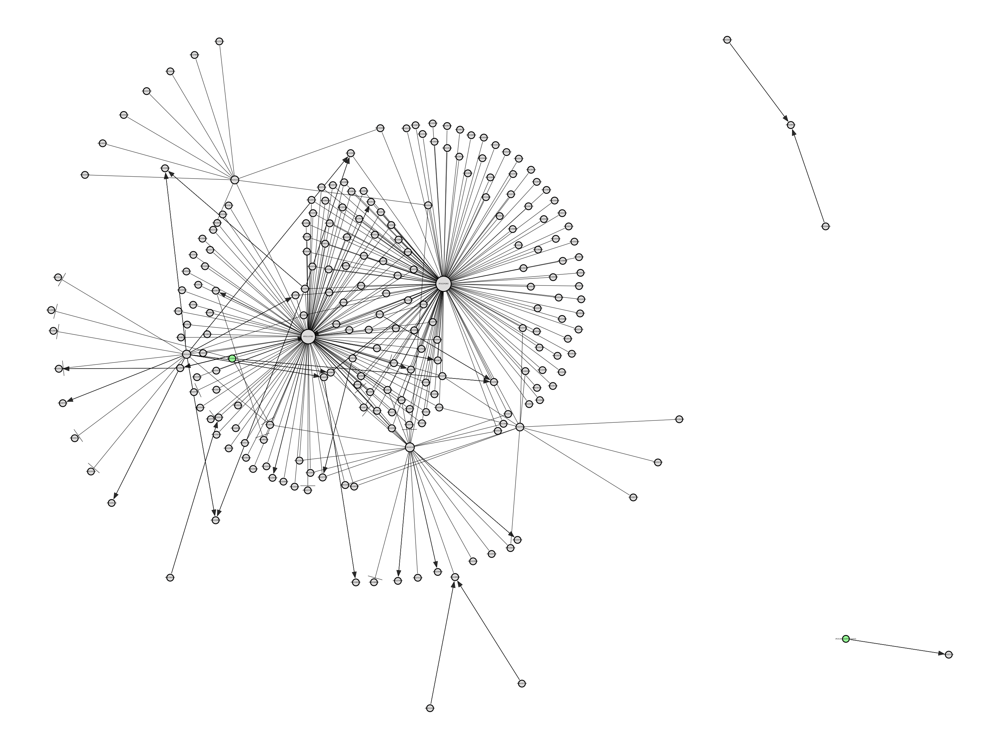

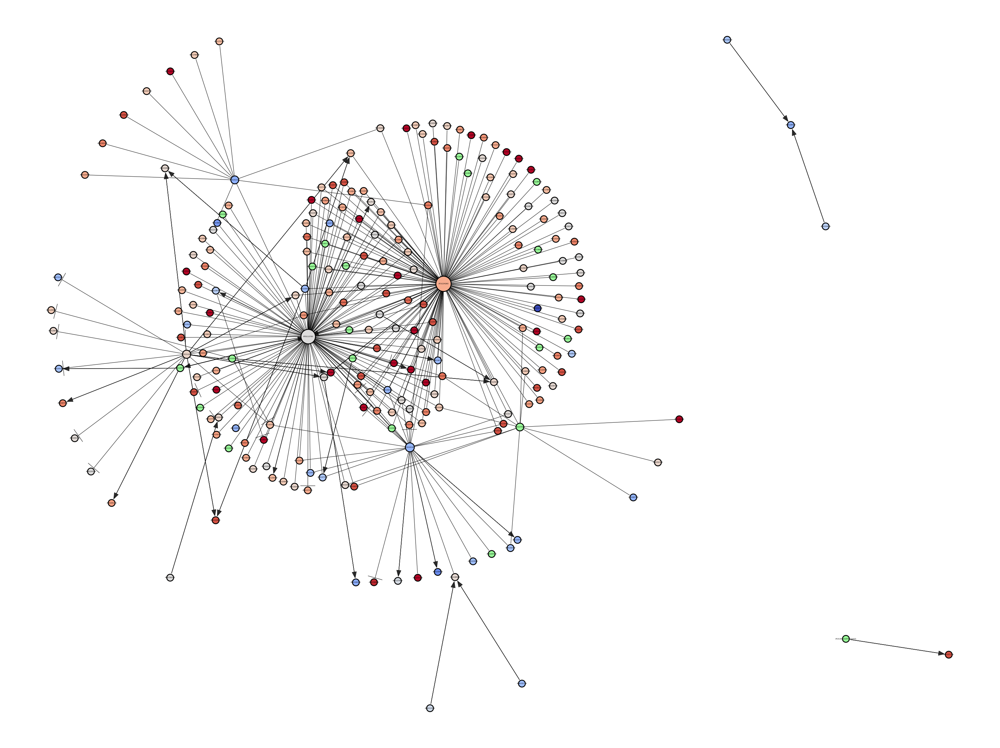

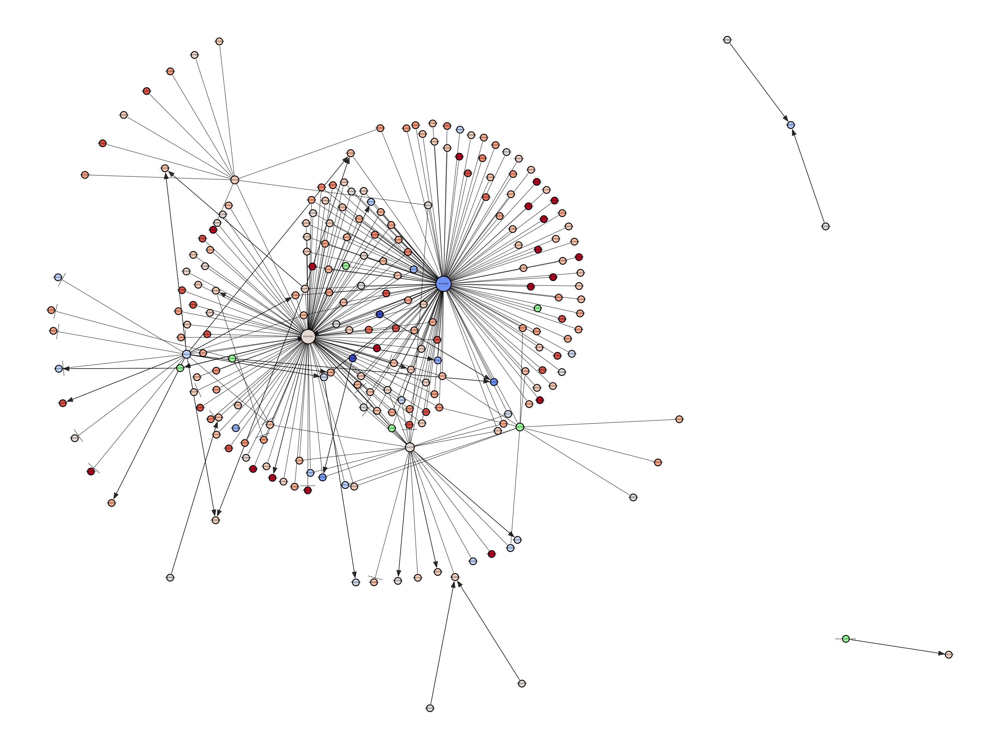

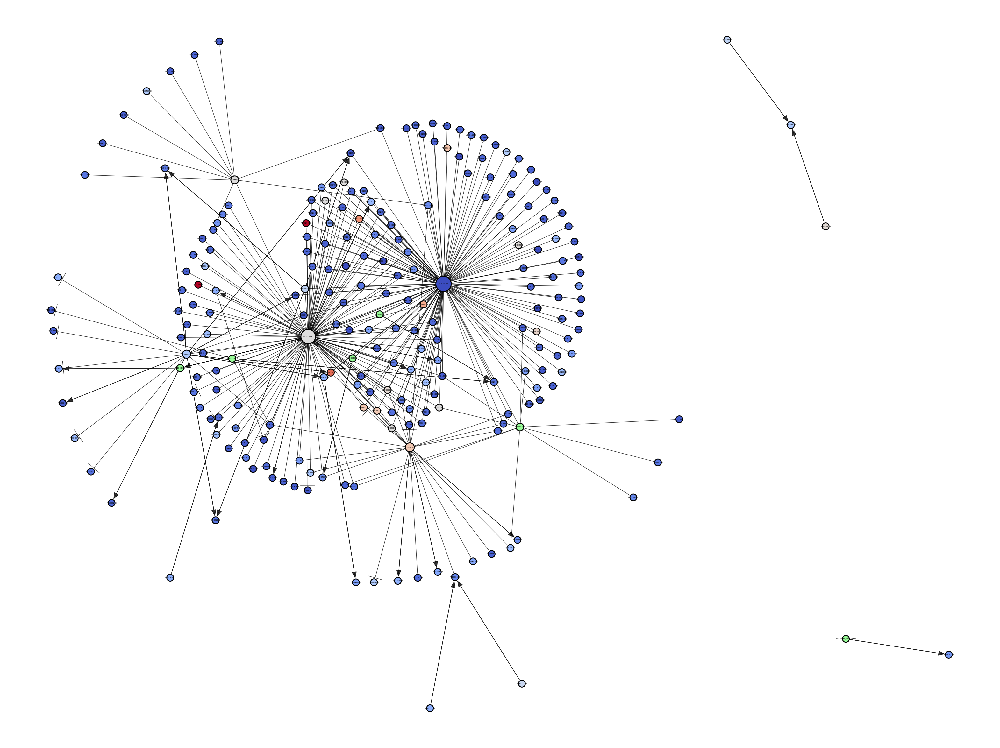

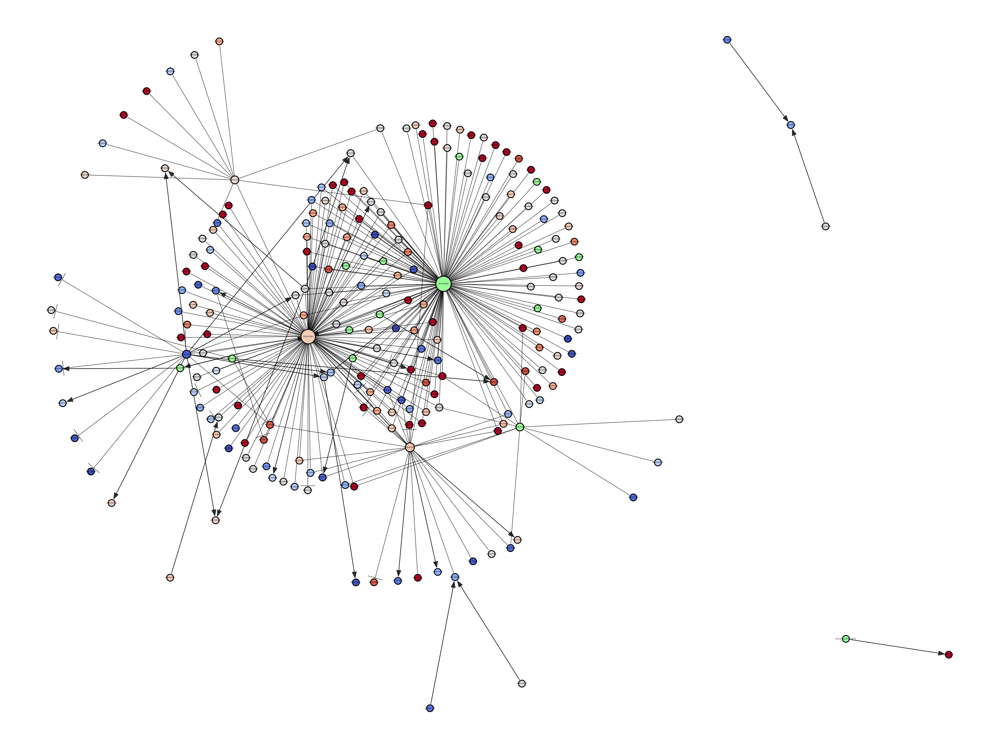

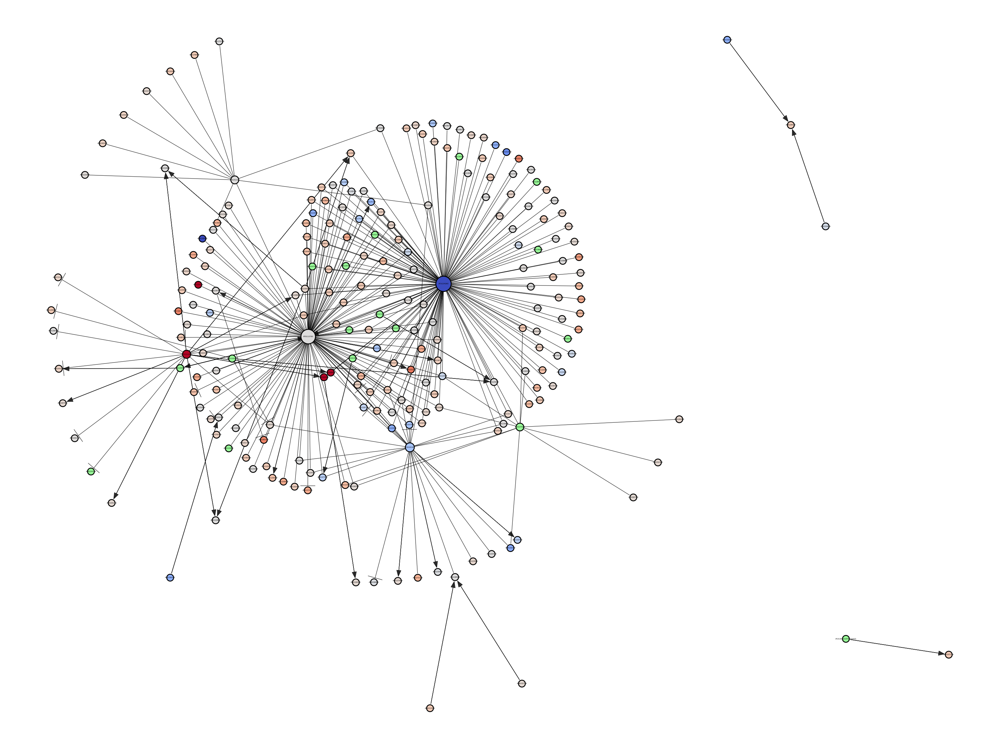

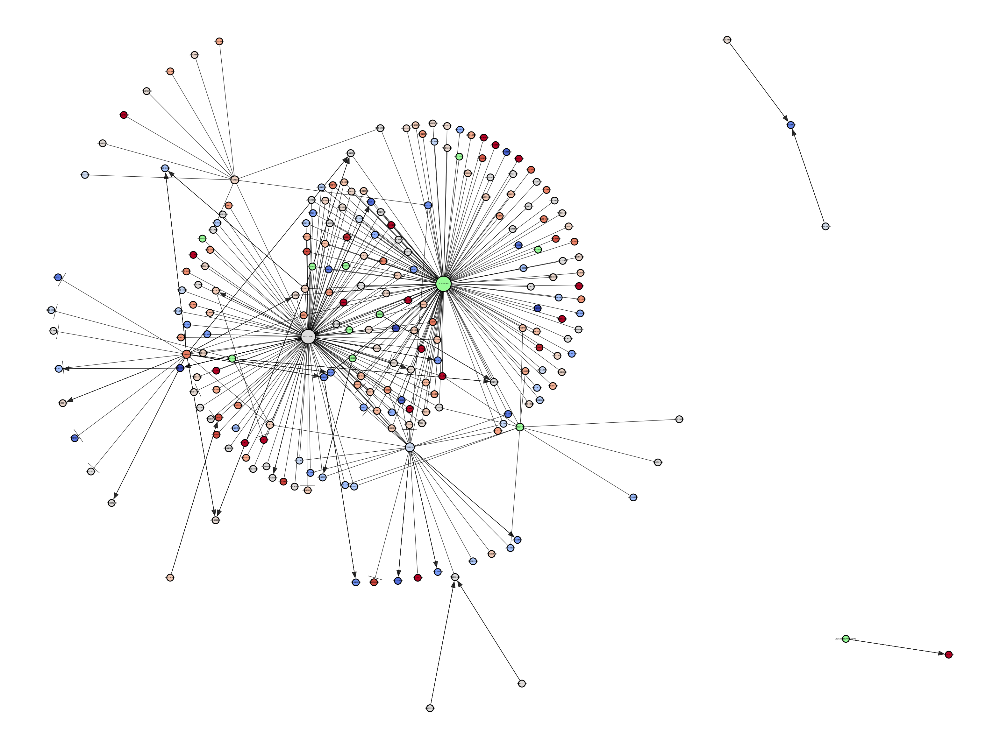

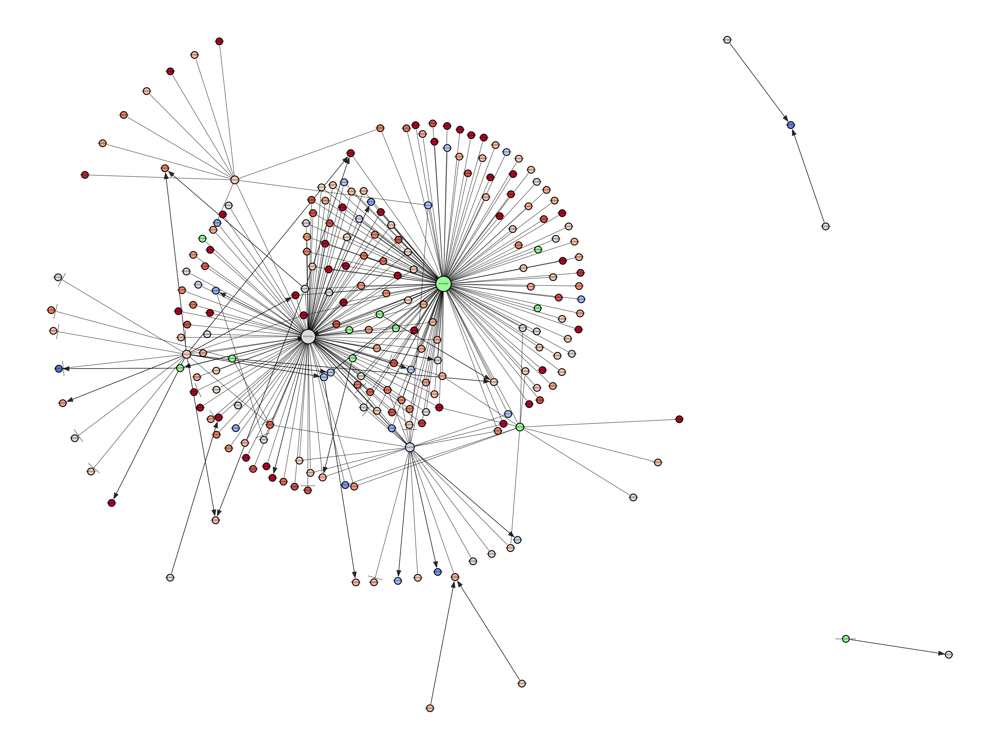

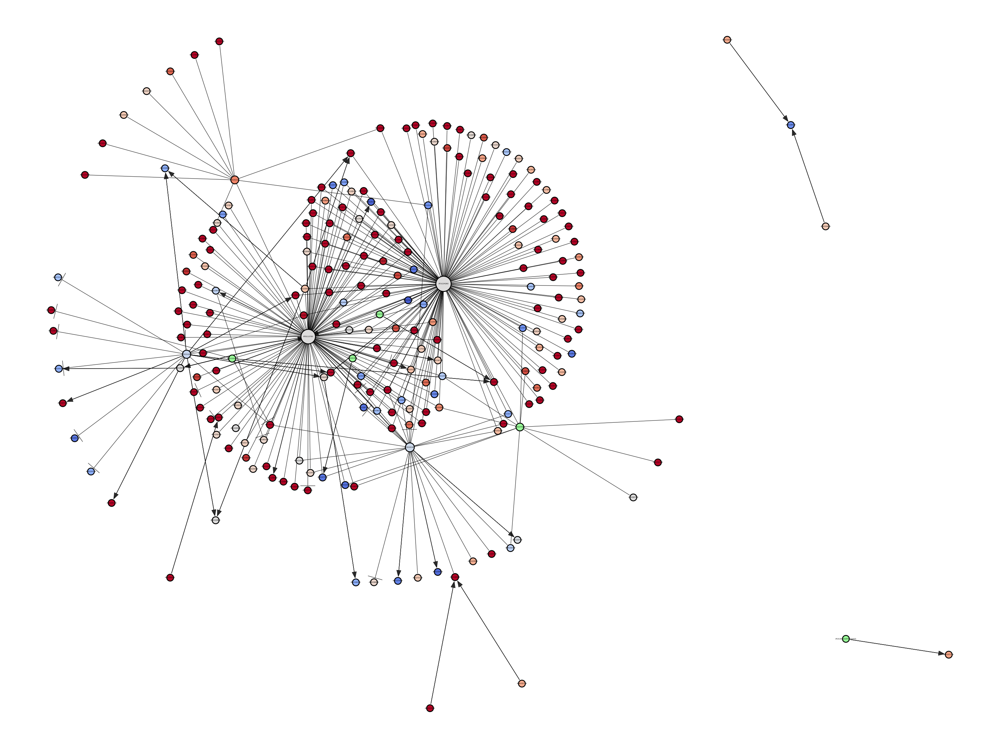

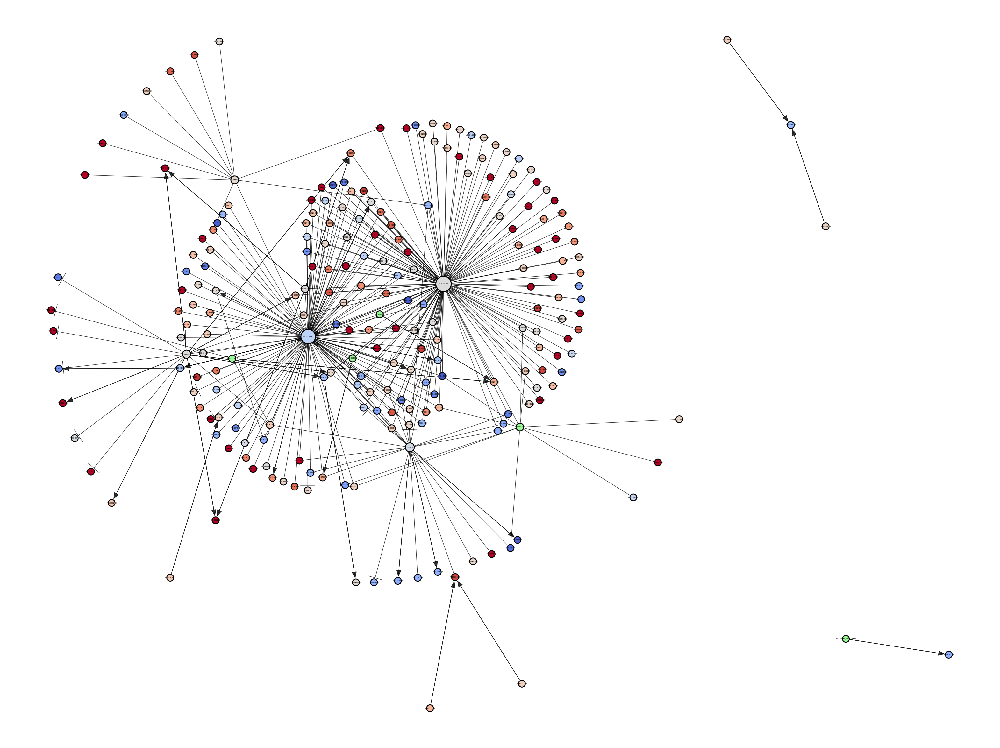

In [6]:
# CELL 5
# This cell plots the networks, although they look better in the app (and in cytoscape for that matter)

# Read the adjacency matrix from cytoscape into a pandas df
def draw_edge(ax, pos, source, target, edge_type, node_sizes, linewidth=0.5):  # Added linewidth parameter
    x1, y1 = pos[source]
    x2, y2 = pos[target]
    dx = x2 - x1
    dy = y2 - y1
    length = np.sqrt(dx**2 + dy**2)

    # Calculate node radii
    node_radius_1 = np.sqrt(node_sizes[source]) / 100
    node_radius_2 = np.sqrt(node_sizes[target]) / 100

    # Lines go to centre of nodes, but that means we can't see
    # the arrows, so we move them further out
    gap = 3

    x1 += (node_radius_1 + gap) * dx / length
    y1 += (node_radius_1 + gap) * dy / length
    x2 -= (node_radius_2 + gap) * dx / length
    y2 -= (node_radius_2 + gap) * dy / length

    dx = x2 - x1
    dy = y2 - y1
    length = np.sqrt(dx**2 + dy**2)
    if edge_type == 'Activation':
        ax.plot([x1, x2], [y1, y2], 'k-', alpha=0.6, linewidth=linewidth)
        # Draw arrow head if it's activated
        head_length = 4
        ax.arrow(x1, y1, dx, dy, head_width=3, head_length=head_length,
                 fc='k', ec='k', length_includes_head=True, alpha=0.8,
                 linewidth=linewidth)
    elif edge_type == 'Repression':
        ax.plot([x1, x2], [y1, y2], 'k-', alpha=0.8, linewidth=linewidth)
        # Draw perpendicular line at the end for repression
        perp_dx = -dy / length * 5
        perp_dy = dx / length * 5
        ax.plot([x2-perp_dx, x2+perp_dx], [y2-perp_dy, y2+perp_dy], 'k-',
                alpha=0.8, linewidth=linewidth)
    else: 
        # just a normal line if we don't know if it's activation or repression
        ax.plot([x1, x2], [y1, y2], 'k-', alpha=0.8, linewidth=linewidth)


def get_node_size(degree, max_degree, min_degree):
    if max_degree == min_degree:
        return 180
    return 60 + (degree - min_degree) * (300 - 60) / (max_degree - min_degree)
    
def get_color(value):
    if pd.isna(value):
        return 'palegreen'
    elif value <= 1:
        return plt.cm.coolwarm(value / 2)
    else:
        return plt.cm.coolwarm(0.5 + (value - 1) / 10)

def create_plot_from_timepoint(adjacency_df, timepoint):
    G = nx.from_pandas_edgelist(adjacency_df, 'Source', 'Target', 'Interaction', create_using=nx.DiGraph())

    # Calculate node sizes based on degree
    degrees = dict(G.degree())
    min_degree = min(degrees.values())
    max_degree = max(degrees.values())


    node_sizes = {node: get_node_size(degree, max_degree, min_degree) for node, degree in degrees.items()}


    # Create a custom colormap. 
    colors_under_1 = plt.cm.Blues(np.linspace(1, 0, 128))
    colors_over_1 = plt.cm.YlOrRd(np.linspace(0, 1, 128))
    all_colors = np.vstack((colors_under_1, colors_over_1))


    # Get colors for nodes based on the fold increase since the last timepoint
    node_colors = []
    for node in G.nodes():
        if node in significant_genes_fold_increases.index:
            value = significant_genes_fold_increases.loc[node, timepoint]
            node_colors.append(get_color(value))
        elif node in all_genes_fold_increases.index:
            value = all_genes_fold_increases.loc[node, timepoint]
            node_colors.append(get_color(value))
        else:
            node_colors.append('palegreen')

    plt.figure(figsize=(20, 15), dpi=200)  

    ax = plt.gca()
    pos = graphviz_layout(G, prog="neato")
    for source, target, data in G.edges(data=True):
        draw_edge(ax, pos, source, target, data['Interaction'], node_sizes, linewidth=0.5) 

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_size=[node_sizes[node] for node in G.nodes()], 
                                node_color=node_colors, edgecolors='black')

    font_sizes = {node: max(2, node_size/200) for node, node_size in node_sizes.items()}

    # Draw labels with varying font sizes
    for node, (x, y) in pos.items():
        plt.text(x, y, node, fontsize=font_sizes[node], ha='center', va='center')



    # Remove axis
    plt.axis('off')

# Read in the adjacency matrix to a pandas dataframe and create a graph for each timepoint
adjacency_df = pd.read_csv('./fold_increase_500_adjacency.adj', sep='\t', header=None, names=['Source', 'Interaction', 'Target'])
create_plot_from_timepoint(adjacency_df, "0")
create_plot_from_timepoint(adjacency_df, "0_to_336")
create_plot_from_timepoint(adjacency_df, "336_to_337")
create_plot_from_timepoint(adjacency_df, "337_to_348")
create_plot_from_timepoint(adjacency_df, "348_to_384")
create_plot_from_timepoint(adjacency_df, "384_to_385")
create_plot_from_timepoint(adjacency_df, "385_to_390")
create_plot_from_timepoint(adjacency_df, "390_to_396")
create_plot_from_timepoint(adjacency_df, "396_to_408")
create_plot_from_timepoint(adjacency_df, "408_to_432")



The following cells use sbmltoodepy to retrieve a model from the imported .xml file from CELL 0. Genes which overlap between the model and the original dataset are retrieved in CELL 7, and the names from the model are mapped onto the names of the original dataset. 

In [7]:
# CELL 6
# Import sbmltoodepy and create a model from the imported .xml

sbmltoodepy.ParseAndCreateModel("metabolism_model_urn.xml", outputFilePath = "metabolism.py", className = "MetabolismModel")
from metabolism import MetabolismModel
model = MetabolismModel()



In [8]:
# CELL 7
# Find overlapping genes between the original dataset and the model

# All genes we found as significantly changing, in a list
print("Significant genes from original data: ", str(significant_genes))
# All genes that the model contains. For some reason they've underscored all of them so I need to do some kinds of startswith
# to extract the genes
print("All genes contained in the model: ", str(model.s.keys()))
# Extract all genes which are found in both of these
# this has big o notation of n squared as it's all pairwise
# - can I improve this??
overlapping_genes_map = {}
for i in significant_genes:
    for j in model.s.keys():
        if j.startswith(i):
            overlapping_genes_map[i] = j

# The map created maps the original experiment gene names to 
# the model gene names, which often end in _i
print("Map of data gene names to model gene names: ", str(overlapping_genes_map))



Significant genes from original data:  ['AT1G01380', 'AT1G01610', 'AT1G01750', 'AT1G02205', 'AT1G02640', 'AT1G02790', 'AT1G02900', 'AT1G03790', 'AT1G03870', 'AT1G03890', 'AT1G04250', 'AT1G04680', 'AT1G04800', 'AT1G04820', 'AT1G05260', 'AT1G05510', 'AT1G06080', 'AT1G06360', 'AT1G07370', 'AT1G08170', 'AT1G08380', 'AT1G08560', 'AT1G09310', 'AT1G09780', 'AT1G09850', 'AT1G10200', 'AT1G10682', 'AT1G11545', 'AT1G11580', 'AT1G11600', 'AT1G12040', 'AT1G12090', 'AT1G12240', 'AT1G12560', 'AT1G12805', 'AT1G13080', 'AT1G13420', 'AT1G14120', 'AT1G14345', 'AT1G15210', 'AT1G15820', 'AT1G16030', 'AT1G16390', 'AT1G16635', 'AT1G17010', 'AT1G17180', 'AT1G17745', 'AT1G17810', 'AT1G19150', 'AT1G19376', 'AT1G20010', 'AT1G20020', 'AT1G20340', 'AT1G21310', 'AT1G21680', 'AT1G23080', 'AT1G23720', 'AT1G24020', 'AT1G24170', 'AT1G26770', 'AT1G27020', 'AT1G27990', 'AT1G28290', 'AT1G28400', 'AT1G28570', 'AT1G28660', 'AT1G28670', 'AT1G29080', 'AT1G29090', 'AT1G29280', 'AT1G29910', 'AT1G29920', 'AT1G29930', 'AT1G30120'

This cell endeavours to run a simulation on the model. Ignoring the initial stage of the experiment where the *Arabidopsis* seeds are dehydrated and lie dormant, the experiment runs for 96 hours, and we simulate two hours at a time; since the model's time scale is in seconds, this amounts to 7200 seconds at a time, run 48 times to achieve the same length of time as the experiment. 

Unfortunately, all genes tested so far in this model have only given a flat line at a concentration of 1, indicating that the model does not function correctly, and so it becomes impossible to run a simulation or find an ODE to model the system with. 

The last tested gene, AT1G17745, is the one currently in use in the cell. Other genes tested can be found in the README.md

Model parameters: (this is empty?) dict_keys([])
Model species list:  dict_keys(['bigg_fdp_i', 'MNXM74_i', 'bigg_dhap_i', 'AT2G01140_i', 'AT2G21330_i', 'AT2G21330_2_i', 'AT2G21330_3_i', 'AT2G36460_i', 'AT2G36460_2_i', 'AT3G52930_i', 'AT4G26520_i', 'AT4G26530_i', 'AT4G38970_i', 'AT4G38970_2_i', 'AT5G03690_i', 'AT5G03690_2_i', 'bigg_h2o_i', 'bigg_acald_i', 'bigg_nad_i', 'bigg_h_i', 'bigg_nadh_i', 'bigg_ac_i', 'AT1G23800_i', 'AT1G44170_i', 'AT1G44170_2_i', 'AT1G54100_i', 'AT3G48000_i', 'AT4G34240_i', 'AT4G34240_2_i', 'AT4G36250_i', 'AT4G36250_2_i', 'bigg_thmpp_i', 'MNXM90909_i', 'AT4G33070_i', 'AT5G01320_i', 'AT5G01330_i', 'AT5G54960_i', 'bigg_etoh_i', 'AT1G22430_i', 'AT1G22440_i', 'AT1G32780_i', 'AT1G64710_i', 'AT1G64710_2_i', 'AT1G77120_i', 'AT4G22110_i', 'AT5G24760_i', 'AT5G42250_i', 'AT5G43940_i', 'AT5G43940_2_i', 'bigg_pyr_i', 'bigg_co2_i', 'AT1G01090_i', 'AT1G24180_i', 'AT1G30120_i', 'AT1G59900_i', 'AT2G34590_i', 'AT5G50850_i', 'MNXM6145_i', 'MNXM96063_i', 'bigg_dhlpro_i', 'bigg_acc

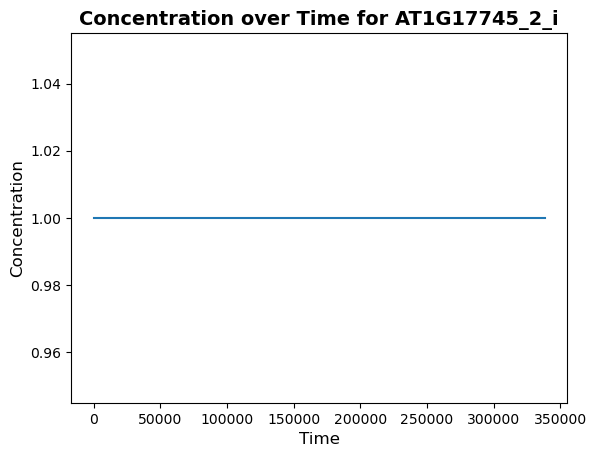

In [9]:
# CELL 8
# Try to run a simulation on the model to look at the ODEs.
# From the paper, time units are by default in seconds, while the experiment generating the data is in hours
# 3600 seconds in an hour, so let's set time interval to 7200, for two hours. 
print("Model parameters: (this is empty?)", str(model.p.keys()))
print("Model species list: ", str(model.s.keys()))
gene_1 = overlapping_genes_map["AT1G17745"]
model.s[gene_1].concentration
times = np.zeros(48)
times[0] = model.time
concentrations = np.zeros(48)
concentrations[0] = model.s[gene_1].concentration
timeinterval = 7200

for i in range(47):
	model.RunSimulation(timeinterval)
	times[i+1] = model.time
	concentrations[i+1] = model.s[gene_1].concentration
plt.xlabel('Time', fontsize=12)
plt.ylabel('Concentration', fontsize=12)
plt.title(f'Concentration over Time for {gene_1}', fontsize=14, fontweight='bold')
plt.plot(times,concentrations)
filename = f'images/{gene_1}.png'
plt.savefig(filename, dpi=300, bbox_inches='tight')